# Wildfire Data Analysis
---

#### Imports

In [34]:
import pandas as pd
import numpy as np
import sqlite3
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from math import ceil

In [35]:
# Custom imports and styles
import utils
from importlib import reload
reload(utils);

In [36]:
plt.style.use('./styles.txt')

___

<a id='intro'></a>

# Introduction

To begin this project, we will need to investigate the wildfire data set. The analysis of the data in this work will not create any of the models that will ultimately do the heavy lifting in the project, but intends to prepare the data and allow us to derive some preliminary insights which we may propogate forward into the latter stages of the project.
    
---

# Wildfire Data

<a id='dd'></a>

### Data Dictionary

|Column Name|Description|
|:--        | :--       |
|OBJECTID|ID of the fire within the dataset|
|FOD_ID| Global unique identifier.|
|FPA_ID| Unique identifier that contains information necessary to track back to the original record in the source dataset.|
|SOURCE_SYSTEM_TYPE| Type of source database or system that the record was drawn from (federal, nonfederal, or interagency).|
|SOURCE_SYSTEM| Name of or other identifier for source database or system that the record was drawn from. See Table 1 in Short (2014), or \Supplements\FPAFODsourcelist.pdf, for a list of sources and their identifier.|
|NWCG_REPORTING_AGENCY|Active National Wildlife Coordinating Group (NWCG) Unit Identifier for the agency preparing the fire report (BIA = Bureau of Indian Affairs, BLM = Bureau of Land Management, BOR = Bureau of Reclamation, DOD = Department of Defense, DOE = Department of Energy, FS = Forest Service, FWS = Fish and Wildlife Service, IA = Interagency Organization, NPS = National Park Service, ST/C&L = State, County, or Local Organization, and TRIBE = Tribal Organization).|
|NWCG_REPORTING_UNIT_ID|Active NWCG Unit Identifier for the unit preparing the fire report.|
|NWCG_REPORTING_UNIT_NAME|Active NWCG Unit Name for the unit preparing the fire report.|
|SOURCE_REPORTING_UNIT|Code for the agency unit preparing the fire report, based on code/name in the source dataset.|
|SOURCE_REPORTING_UNIT_NAME|Name of reporting agency unit preparing the fire report, based on code/name in the source dataset.|
|LOCAL_FIRE_REPORT_ID|Number or code that uniquely identifies an incident report for a particular reporting unit and a particular calendar year.
|LOCAL_INCIDENT_ID | Number or code that uniquely identifies an incident for a particular local fire management organization within a particular calendar year.|
|FIRE_CODE | Code used within the interagency wildland fire community to track and compile cost information for emergency fire suppression (https://www.firecode.gov/).|
|FIRE_NAME | Name of the incident, from the fire report (primary) or ICS-209 report (secondary).|
|ICS_209_INCIDENT_NUMBER | Incident (event) identifier, from the ICS-209 report.|
|ICS_209_NAME|Name of the incident, from the ICS-209 report.|
|MTBS_ID|Incident identifier, from the MTBS perimeter dataset.|
|MTBS_FIRE_NAME|Name of the incident, from the MTBS perimeter dataset.|
|COMPLEX_NAME | Name of the complex under which the fire was ultimately managed, when discernible.|
|FIRE_YEAR| Calendar year in which the fire was discovered or confirmed to exist.|
|DISCOVERY_DATE | Date on which the fire was discovered or confirmed to exist.|
|DISCOVERY_DOY | Day of year on which the fire was discovered or confirmed to exist.|
|DISCOVERY_TIME | Time of day that the fire was discovered or confirmed to exist.|
|STAT_CAUSE_CODE | Code for the (statistical) cause of the fire.|
|STAT_CAUSE_DESCR | Description of the (statistical) cause of the fire.|
|CONT_DATE | Date on which the fire was declared contained or otherwise controlled (mm/dd/yyyy where mm=month, dd=day, and yyyy=year).|
|CONT_DOY| Day of year on which the fire was declared contained or otherwise controlled.|
|CONT_TIME| Time of day that the fire was declared contained or otherwise controlled (hhmm where hh=hour, mm=minutes).|
|FIRE_SIZE | Estimate of acres within the final perimeter of the fire.
|FIRE_SIZE_CLASS | Code for fire size based on the number of acres within the final fire perimeter expenditures (A=greater than 0 but less than or equal to 0.25 acres, B=0.26-9.9 acres, C=10.0-99.9 acres, D=100-299 acres, E=300 to 999 acres, F=1000 to 4999 acres, and G=5000+ acres).|
|LATITUDE | Latitude (NAD83) for point location of the fire (decimal degrees).|
|LONGITUDE| Longitude (NAD83) for point location of the fire (decimal degrees).|
|OWNER_CODE| Code for primary owner or entity responsible for managing the land at the point of origin of the fire at the time of the incident.|
|OWNER_DESCR | Name of primary owner or entity responsible for managing the land at the point of origin of the fire at the time of the incident.
|STATE | Two-letter alphabetic code for the state in which the fire burned (or originated), based on the nominal designation in the fire report.|
|COUNTY| County, or equivalent, in which the fire burned (or originated), based on nominal designation in the fire report.|
|FIPS_CODE | Three-digit code from the Federal Information Process Standards (FIPS) publication 6-4 for representation of counties and equivalent entities.|
|FIPS_NAME | County name from the FIPS publication 6-4 for representation of counties and equivalent entities.|
|Shape| The shape of a wildfire|

---

## Data Loading 

In [38]:
# Read sqlite query results into a pandas DataFrame
con = sqlite3.connect("data/wildfires.sqlite")
df = pd.read_sql_query("SELECT * FROM fires", con)

In [39]:
# Look at sample rows
pd.set_option('display.max_columns', None)
utils.sample_rows(df)

,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,SOURCE_REPORTING_UNIT,SOURCE_REPORTING_UNIT_NAME,LOCAL_FIRE_REPORT_ID,LOCAL_INCIDENT_ID,FIRE_CODE,FIRE_NAME,ICS_209_INCIDENT_NUMBER,ICS_209_NAME,MTBS_ID,MTBS_FIRE_NAME,COMPLEX_NAME,FIRE_YEAR,DISCOVERY_DATE,DISCOVERY_DOY,DISCOVERY_TIME,STAT_CAUSE_CODE,STAT_CAUSE_DESCR,CONT_DATE,CONT_DOY,CONT_TIME,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME,Shape
0,1,1,FS-1418826,FED,FS-FIRESTAT,FS,USCAPNF,Plumas National Forest,0511,Plumas National Forest,1,PNF-47,BJ8K,FOUNTAIN,None,None,None,None,None,2005,2453403.5,33,1300,9.0,Miscellaneous,2453403.5,33.0,1730,0.10,A,40.036944,-121.005833,5.0,USFS,CA,63,063,Plumas,b'\x00\x01\xad\x10\x00\x00\xe8d\xc2\x92_@^\xc0...
1,2,2,FS-1418827,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,0503,Eldorado National Forest,13,13,AAC0,PIGEON,None,None,None,None,None,2004,2453137.5,133,0845,1.0,Lightning,2453137.5,133.0,1530,0.25,A,38.933056,-120.404444,5.0,USFS,CA,61,061,Placer,b'\x00\x01\xad\x10\x00\x00T\xb6\xeej\xe2\x19^\...
1233293,1233294,1633579,SFO-AZ-020517,NONFED,ST-NASF,ST/C&L,USAZAZS,Arizona State Forestry Division - State Office,AZAZS,Arizona State Forestry Division - State Office,None,AZ-020517,None,WALNUT #2,None,None,None,None,None,2002,2452431.5,157,1245,5.0,Debris Burning,NaN,NaN,None,0.25,A,31.729900,-110.071500,14.0,MISSING/NOT SPECIFIED,AZ,None,None,None,b'\x00\x01\xad\x10\x00\x00|j\xbct\x93\x84[\xc0...
608484,608485,656361,SFO-TX01430696-10343845,NONFED,ST-NASF,ST/C&L,USTXTXS,Texas A & M Forest Service,TXCON,Texas Forest Service - Conroe Area,None,None,None,None,None,None,None,None,None,1996,2450093.5,11,None,3.0,Smoking,NaN,NaN,None,301.00,E,30.860420,-95.510410,14.0,MISSING/NOT SPECIFIED,TX,Walker,471,Walker,b'\x00\x01\xad\x10\x00\x00Hc\xb4\x8e\xaa\xe0W\...
1880463,1880464,300348377,2015CAIRS29218079,NONFED,ST-CACDF,ST/C&L,USCATCU,Tuolumne-Calaveras Unit,CATCU,Tuolumne-Calaveras Unit,570462,000380,None,None,None,None,None,None,None,2015,2457309.5,287,2309,13.0,Missing/Undefined,NaN,NaN,None,2.00,B,37.672235,-120.898356,12.0,MUNICIPAL/LOCAL,CA,None,None,None,b'\x00\x01\xad\x10\x00\x00x\xba_\xaa~9^\xc0\xb...
1880464,1880465,300348399,2015CAIRS26733926,NONFED,ST-CACDF,ST/C&L,USCABDU,San Bernardino Unit,CABDU,CDF - San Bernardino Unit,535436,003225,None,BARKER BL BIG_BEAR_LAKE_,None,None,None,None,None,2015,2457095.5,73,2128,9.0,Miscellaneous,NaN,NaN,None,0.10,A,34.263217,-116.830950,13.0,STATE OR PRIVATE,CA,None,None,None,b'\x00\x01\xad\x10\x00\x00\x1c\xa7\xe8H.5]\xc0...


In [40]:
utils.BasicEda(df, 'Wildfires')

WILDFIRES
---------

Rows: 1880465    Columns: 39

Total null rows: 0
Percentage null rows:  0.000%

Total duplicate rows: 0
Percentage duplicate rows:  0.000%

OBJECTID                        int64
FOD_ID                          int64
FPA_ID                         object
SOURCE_SYSTEM_TYPE             object
SOURCE_SYSTEM                  object
NWCG_REPORTING_AGENCY          object
NWCG_REPORTING_UNIT_ID         object
NWCG_REPORTING_UNIT_NAME       object
SOURCE_REPORTING_UNIT          object
SOURCE_REPORTING_UNIT_NAME     object
LOCAL_FIRE_REPORT_ID           object
LOCAL_INCIDENT_ID              object
FIRE_CODE                      object
FIRE_NAME                      object
ICS_209_INCIDENT_NUMBER        object
ICS_209_NAME                   object
MTBS_ID                        object
MTBS_FIRE_NAME                 object
COMPLEX_NAME                   object
FIRE_YEAR                       int64
DISCOVERY_DATE                float64
DISCOVERY_DOY                   int64
DIS

From this we see that the Wildfires DataFrame is primarily made of categorical columns, most of which describes the fire after it has been identified. These columns will therefore not be useful for the purpose of this project, which will instead focus on the following columns:
- `FIRE_YEAR`
- `DISCOVERY_DOY`
- `FIRE_SIZE`
- `FIRE_SIZE_CLASS`
- `LATITUDE`
- `LONGITUDE`
- `STATE`

But why did we not include important columns, such as `DISCOVERY_DATE` and `SHAPE`. Taking a look at these values individually will allow us to understand why we have made this decision. First, let us look at some of the values stored in the `DISCOVERY_DATE` column.

In [14]:
# Output of DISCOVERY_DATE
df[['DISCOVERY_DATE', 'FIRE_YEAR', 'DISCOVERY_DOY']].head()

,DISCOVERY_DATE,FIRE_YEAR,DISCOVERY_DOY
0,2453403.5,2005,33
1,2453137.5,2004,133
2,2453156.5,2004,152
3,2453184.5,2004,180
4,2453184.5,2004,180


As we can see, the `DISCOVERY_DATE` vairable is stored as a float. Typically, dates written as a number would have a discernible year, month, and day pattern. A corollary of this, is that a date written as a number would not have a decimal place. Because of this, the `DISCOVERY_DATE` column will not be used. Instead the date will be calculated from the `FIRE_YEAR` and `DISCOVERY_DOY` columns - a procedure we will carry out at a later stage.

The latter of the two omitted columns, is `SHAPE`. Let's take a look at how this is stored:

In [15]:
# How is shape stored?
df.iloc[0, -1]

b'\x00\x01\xad\x10\x00\x00\xe8d\xc2\x92_@^\xc0\xe0\xc8l\x98\xba\x04D@\xe8d\xc2\x92_@^\xc0\xe0\xc8l\x98\xba\x04D@|\x01\x00\x00\x00\xe8d\xc2\x92_@^\xc0\xe0\xc8l\x98\xba\x04D@\xfe'

This output is hard to decipher; even after reaching out to the people who had last updated the dataset, I was unable to figure out what this output represented. Consequently, we will also have to omit shape from our analysis.

Having explained why certain columns remain while others are excluded, let us update the DataFrame that we will be working with.

In [41]:
# Get only the relevant columns
query = """
    SELECT FIRE_YEAR, DISCOVERY_DOY, FIRE_SIZE, FIRE_SIZE_CLASS, LATITUDE, LONGITUDE, STATE
    FROM fires
"""
wildfires = pd.read_sql_query(query, con)

In [42]:
utils.BasicEda(wildfires, 'Wildfires')

WILDFIRES
---------

Rows: 1880465    Columns: 7

Total null rows: 0
Percentage null rows:  0.000%

Total duplicate rows: 7176
Percentage duplicate rows:  0.004%

FIRE_YEAR            int64
DISCOVERY_DOY        int64
FIRE_SIZE          float64
FIRE_SIZE_CLASS     object
LATITUDE           float64
LONGITUDE          float64
STATE               object
dtype: object

Number of categorical columns: 2
Number of numeric columns: 5


The number of columns has decreased significantly and we are now primarily focusing on numerical columns. It is also interesting to note that the number of duplicate rows has actually increased from the previously calculated 0. Presumably the columns that we removed were the reason why these duplicates were not initially discovered. If the deleted columns had differences that meant these rows were not considered duplicates, are they perhaps different fires? The columns that we are left with describe the most fundamental aspects of the wildfire. If these are duplicated then it is likely that they are in fact duplicates, and the differences displayed in the other columns were most likely mistakes.

Now we can start to clean the data and create columns that are missing.

---

## Data Cleaning

The first step in our cleaning process will be to identify any null values and duplicates in the data set. Once these have been identified and appropriately handled, we can create the derived column (`DATE`) that is currently missing. Although we have already calculated these values, we will calculate these again to verify our results.

In [43]:
# Find null values for each column
print(wildfires.isna().sum(), end='\n\n')
print(f'There are {wildfires.isna().sum().sum()} total null values')

FIRE_YEAR          0
DISCOVERY_DOY      0
FIRE_SIZE          0
FIRE_SIZE_CLASS    0
LATITUDE           0
LONGITUDE          0
STATE              0
dtype: int64

There are 0 total null values


In [44]:
# Find duplicates
duplicates = wildfires.duplicated().sum()
percentage = duplicates / wildfires.shape[0]
print(f'There are a total of {duplicates} duplicates in the data set, which is approximately {percentage: .3f}% of the data set')

There are a total of 7176 duplicates in the data set, which is approximately  0.004% of the data set


Proportionally, this is a negligible number of duplicates which allows us to elaborate on our discussion about these duplicates earlier. Even if the values are not duplicates, removing only $\approx0.004$% of our entire dataset will not hinder our analysis.

In [45]:
prev_shape = wildfires.shape[0]
wildfires.drop_duplicates(inplace=True)
current_shape = wildfires.shape[0]
print(f'The number of rows in the DataFrame has decreased from {prev_shape} to {current_shape}')

The number of rows in the DataFrame has decreased from 1880465 to 1873289


Now that the data has been cleaned, we can create the `DATE` column, using the `FIRE_YEAR` and `DISCOVERY_DOY` columns.

In [46]:
# Create the DATE column
wildfires['DATE'] = pd.to_datetime(wildfires['FIRE_YEAR'] * 1000 + wildfires['DISCOVERY_DOY'], format='%Y%j')

# Pop the column
date = wildfires.pop('DATE')

# Insert it into the relevant position
wildfires.insert(0, 'DATE', date)

In [47]:
wildfires.head()

,DATE,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,STATE
0,2005-02-02,2005,33,0.10,A,40.036944,-121.005833,CA
1,2004-05-12,2004,133,0.25,A,38.933056,-120.404444,CA
2,2004-05-31,2004,152,0.10,A,38.984167,-120.735556,CA
3,2004-06-28,2004,180,0.10,A,38.559167,-119.913333,CA
4,2004-06-28,2004,180,0.10,A,38.559167,-119.933056,CA


A quick look at the `dtypes` will show that a datetime column has been added.

In [48]:
wildfires.dtypes

DATE               datetime64[ns]
FIRE_YEAR                   int64
DISCOVERY_DOY               int64
FIRE_SIZE                 float64
FIRE_SIZE_CLASS            object
LATITUDE                  float64
LONGITUDE                 float64
STATE                      object
dtype: object

In [49]:
# Optional, sort the DataFrame by DATE
wildfires.sort_values(by='DATE', inplace=True)
wildfires.reset_index(drop=True, inplace=True)

In [50]:
wildfires.head()

,DATE,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,STATE
0,1992-01-01,1992,1,3.0,B,33.063400,-90.120813,MS
1,1992-01-01,1992,1,1.0,B,33.779167,-79.691667,SC
2,1992-01-01,1992,1,20.0,C,33.558333,-79.945833,SC
3,1992-01-01,1992,1,40.0,C,43.065609,-105.066200,WY
4,1992-01-01,1992,1,2.0,B,33.358333,-80.120833,SC


---

## General Wildfire Trends

The size of the wildfires dataset means that in this section we will be looking derive some basic insgihts; the first of these will be how the number of wildfires has changed over time. Considering that we are working with a dataset that spans from 1992-2015, it is important to see how the number of wildfires is distributed throughout the years. In our case, we are expecting there to be an increase over time, considering the effect of climate change.

In [52]:
# Count total fires per year
tmp = wildfires.groupby('FIRE_YEAR').count()

# Create the figure
fig = px.line(
    data_frame=tmp,
    x=tmp.index.values,
    y='STATE',
    title='Yearly Analysis: Number of Wildfires over the Years',
    labels={
        'x': 'Year',
        'STATE': 'Total Fires'
    }
)

# Include slider
fig.update_xaxes(rangeslider_visible=True)

# Show the figure
fig.show()

Surpisingly, the number of wildfires in the US peaked in 2006, decreasing ever since then. It will be interesting to analyse the weather and greenhouse gas emissions during that period. We can also analyse the number of wildfires on a more granular level - daily - seeing the number of wildfires recorded every day since 1992. This will hopefully show some seasonality.

In [53]:
# Count total fires per year
tmp = wildfires.groupby('DATE').count()

# Create the figure
fig = px.line(
    data_frame=tmp,
    x=tmp.index.values,
    y='STATE',
    title='Time Series Analysis: Number of Wildfires over the Years',
    labels={
        'x': 'Date',
        'STATE': 'Total Fires'
    }
)

# Include slider
fig.update_xaxes(rangeslider_visible=True)

# Show the figure
fig.show()

We can see that there is in fact some seasonality associated with wildfires, as the spike for each year occurs around the warmer summer months.

Another basic metric we can look at is the number of wildfires for each state.

In [54]:
# Get count of the wildfires by state
tmp = wildfires.groupby('STATE').agg(
    count_col=pd.NamedAgg(column='FIRE_YEAR', aggfunc="count")
)

# Map the number of wildfires
fig = px.choropleth(
    locations=tmp.index.values,
    locationmode='USA-states',
    color=tmp['count_col'],
    scope='usa',
    title='Total Number of Wildfires Per State'
)
fig.show()

From the map above three states stand out: California, Georgia, and Texas. Of these, California has the highest number of wildfires, primarily as a direct consequence of climate change. Warmer temperatures and longer dry seasons bring on increasingly intense droughts, culminating in a greater amount of wildfires.

In [55]:
cols = 4
rows = 6

years = df['FIRE_YEAR'].unique()
years.sort()

plt.subplots(rows, cols, figsize=(30, 30), dpi=300)

for index, year in enumerate(years):
    position = index + 1
    plt.subplot(rows, cols, position)
    plt.title(f'Histogram for {year}')
    sns.histplot(data=wildfires[wildfires['FIRE_YEAR'] == year].sort_values('FIRE_SIZE_CLASS'),
                 x='FIRE_SIZE_CLASS')
    plt.xlabel('Fire Size Class')
    plt.ylabel('')

plt.tight_layout()
plt.show()

## Further Analysis

As mentioned previously, the size of the data set limits our ability to conduct analysis on the data set as a whole. Instead, what we can do, is create a sample DataFrame of 10,000 rows, to which we will append all the greenhouse gas emissions data and weather data. Using this smaller sample we will then carry out some exploratory data analysis (EDA)

In [30]:
# Create a sample DataFrame
sample = wildfires.sample(30000)

In [31]:
sample_new.head()

,index,DATE,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,STATE
0,46,1992-01-01,1992,1,0.10,A,43.325000,-101.018500,SD
1,0,1992-01-01,1992,1,3.00,B,33.063400,-90.120813,MS
2,36,1992-01-01,1992,1,1.00,B,33.058333,-79.979167,SC
3,132,1992-01-02,1992,2,0.25,A,40.775000,-74.854160,NJ
4,215,1992-01-03,1992,3,0.50,B,29.790000,-82.370000,FL


In [ ]:
# Rest index but keep original for reference and sort 
sample.sort_values(by='DATE', inplace=True)
sample.reset_index(inplace=True)

In [40]:
utils.BasicEda(sample, 'Wildfire Sample')

WILDFIRE SAMPLE
---------------

Rows: 30000    Columns: 9

Total null rows: 0
Percentage null rows:  0.000%

Total duplicate rows: 0
Percentage duplicate rows:  0.000%

index                       int64
DATE               datetime64[ns]
FIRE_YEAR                   int64
DISCOVERY_DOY               int64
FIRE_SIZE                 float64
FIRE_SIZE_CLASS            object
LATITUDE                  float64
LONGITUDE                 float64
STATE                      object
dtype: object

Number of categorical columns: 2
Number of numeric columns: 6


Now that we have created our sample and sorted it, we can save the DataFrame to a `.pkl` file.

In [32]:
# # Save the sample for access at later stages
# sample.to_pickle('data/sample.pkl')

In [56]:
sample = pd.read_pickle('data/sample.pkl')
sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   index            30000 non-null  int64         
 1   DATE             30000 non-null  datetime64[ns]
 2   FIRE_YEAR        30000 non-null  int64         
 3   DISCOVERY_DOY    30000 non-null  int64         
 4   FIRE_SIZE        30000 non-null  float64       
 5   FIRE_SIZE_CLASS  30000 non-null  object        
 6   LATITUDE         30000 non-null  float64       
 7   LONGITUDE        30000 non-null  float64       
 8   STATE            30000 non-null  object        
dtypes: datetime64[ns](1), float64(3), int64(3), object(2)
memory usage: 2.1+ MB


Let's look at some of the distributions present within this sample.

In [57]:
# Split into categorical and numeric columns
cat_cols = sample.select_dtypes('object')

# Drop the index for the analysis
num_cols = sample.select_dtypes('number').drop('index', axis=1)

#### Analysing Numerical Columns

Now that we have split up our columns we are able to analyse these columns. Firstly, we will look at the statistical data and then visualise this using histograms. It should be noted that at the moment we are not able to derive much information from these columns and their distrbutions considering that all but one of them are spatio-temporal. It will be interesting to see how `FIRE_SIZE` is distributed in comparison to the way `FIRE_SIZE_CLASS` was distributed above.

In [58]:
num_cols.describe()

,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,LATITUDE,LONGITUDE
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,2003.727333,164.310100,67.515576,36.762301,-95.846038
std,6.648949,90.126064,2793.018298,6.110786,16.756508
min,1992.000000,1.000000,0.001000,17.956533,-166.152700
25%,1998.000000,88.000000,0.100000,32.816525,-110.447170
50%,2004.000000,163.000000,1.000000,35.437674,-92.350744
75%,2009.000000,230.000000,3.365000,40.738334,-82.361290
max,2015.000000,366.000000,419884.000000,67.983300,-65.320000


As we can see from the output, `FIRE_SIZE` is extremely skewed, with a median value of 1 but a standard distribution of approximately 2793. It should be noted that the `FIRE_SIZE` is calculated in acres, meaning that the range in wildfire sizes is extremely large. We will now look at how these values are distributed visually. We will not plot `FIRE_SIZE` as this prevents the code from executing and will also yield no decipherable result.

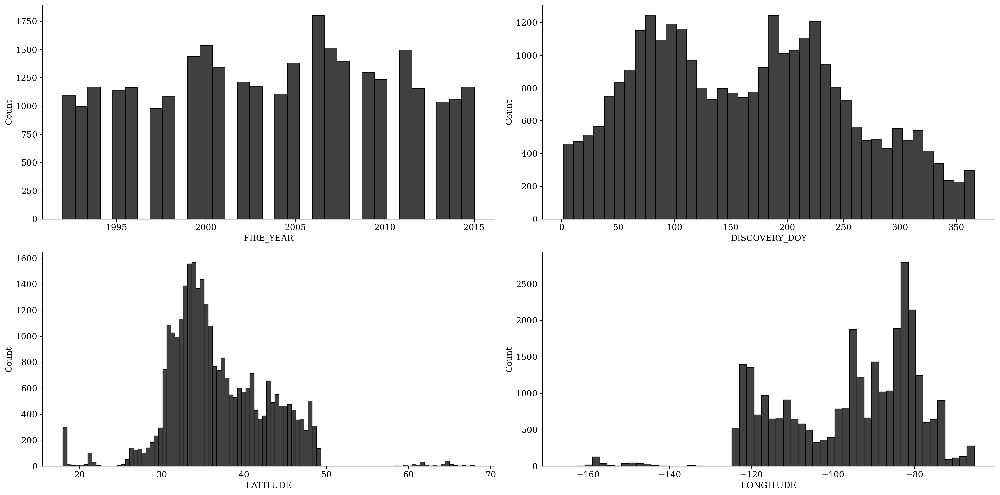

In [59]:
tmp = num_cols.drop('FIRE_SIZE', axis=1)

# Create the rows and columns variables
columns = 2
rows = ceil(len(tmp.columns) / columns)

# Create subplots
plt.subplots(rows, columns, figsize=(20, 10), dpi=200)

# Loop through the columns
for index, column in enumerate(tmp):
    position = index + 1
    mean = tmp[column].mean()
    median = tmp[column].median()
    
    # Create subplot
    plt.subplot(rows, columns, position)
    sns.histplot(tmp[column])

plt.tight_layout()
plt.show()

From the plots above we are not able to derive too much information. We are however able to see that there does seem to be a seasonal uptick in wildfires during the Spring and Summer A plot that may provide more insightful information is a plot of the fires in the sample on a map of the United States.

In [60]:
import geopandas as gpd

In [66]:
# Get map
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
us = world[world['name'] == 'United States of America']

# Plot scatter and map
plt.figure(figsize=(30, 30))
us.plot(figsize=(30, 30))
plt.title('Map of US Wildfires')
sns.scatterplot(x='LONGITUDE', y='LATITUDE', hue='FIRE_SIZE_CLASS', size='FIRE_SIZE', data=sample)
plt.axis(False)
plt.savefig('figs/map_fire_samples.png')
plt.show()

<Figure size 9000x9000 with 0 Axes>

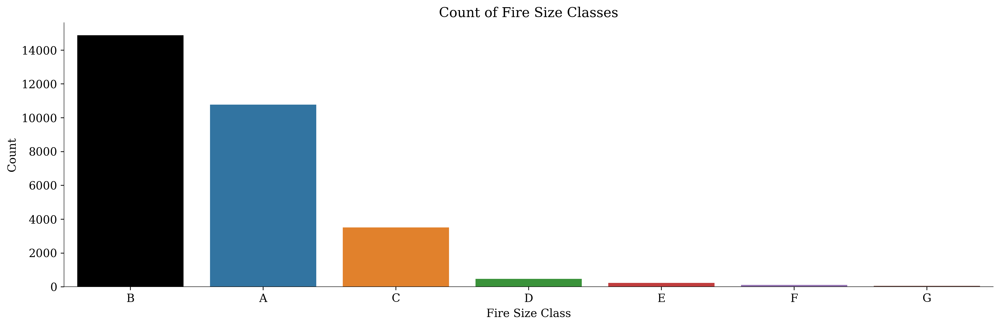

In [64]:
fire_size_class = utils.count_percentage_df(sample['FIRE_SIZE_CLASS'])

plt.figure(figsize=(15, 5), dpi=300)
plt.title('Count of Fire Size Classes')
plt.xlabel('Fire Size Class')
sns.barplot(data=fire_size_class,
            x=fire_size_class.index,
            y='Count')
plt.savefig('figs/firecounts.jpg')
plt.show()

As expected, the majority of the fires fall within the A and B classes. Interestingly, we see that the larger proportion of the wildfires falls within the B fire size class. From the map we are able to see certain hotspots for the location of wildfires. Based on our previous analysis it is unsurprising that California has a large amount of wildfires, but in general it seems that there are a lot of wildfires along the western coast more generally. Again, we see that in the South East of the US, there is another major focal point around Georgia and Florida. Middle America seems to have a lower amount of wildfires, potentially associated with their lack of expansive areas of greenlands. 

We do also see some data points that stand out. Of the few wildfires that fall within the G class, a fair amount are found in Alaska. Perhaps we can look at the data for the top 20 largest wildfires. 

In [29]:
sample.sort_values('FIRE_SIZE', ascending=False).head(20)

,index,DATE,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,STATE
14959,933903,2004-06-12,2004,164,419884.0,G,65.746700,-152.231500,AK
18399,1150644,2006-09-03,2006,246,150270.7,G,40.825800,-116.720300,NV
22547,1407601,2009-08-02,2009,214,101150.0,G,64.120000,-148.750000,AK
24528,1532013,2011-04-09,2011,99,60000.0,G,35.690300,-101.916400,TX
13840,865902,2003-07-18,2003,199,50981.0,G,48.883611,-114.551111,MT
17848,1113631,2006-06-03,2006,154,49500.0,G,26.251940,-80.580000,FL
26183,1632814,2012-07-03,2012,185,49305.3,G,67.810800,-162.365300,AK
22440,1400533,2009-07-10,2009,191,41497.0,G,36.224444,-98.918889,OK
23482,1464921,2010-07-12,2010,193,35455.7,G,66.405000,-146.425000,AK
15110,944324,2004-07-19,2004,201,33952.0,G,65.500100,-149.086700,AK


In [33]:
top_20 = sample.sort_values('FIRE_SIZE', ascending=False).head(20)
utils.count_percentage_df(top_20['STATE'])

,Count,Percentage of Total
AK,7,0.35
NV,2,0.10
TX,2,0.10
MT,2,0.10
CA,2,0.10
FL,1,0.05
OK,1,0.05
MN,1,0.05
ID,1,0.05
WY,1,0.05


Of the top 20 wildfires by size, we see that 35% are found within Alaska. This is perhaps due to higher density of vegetation that allows for fires to spread over a larger area. In fact, further research shows that the environment in Alaska is changing significantly as growing seasons coupled with increasing temperatures facilitates the increase in wildfire occurences.

Although we were able to plot the wildfires already, the plot doesn't show how the number and distribution of wildfires across the country has changed over the years. In the plot below, we will be able to show how the fires are distributed for each year.

In [22]:
# Create figure
fig = px.scatter_geo(
    data_frame=sample,
    lon='LONGITUDE',
    lat='LATITUDE',
    color='FIRE_SIZE_CLASS',
    animation_frame='FIRE_YEAR',
    hover_name='FIRE_SIZE',
    width=1000,
    height=800,
    scope='usa'
)

# Show figure
fig.show()

As before, we see that the West Coast, and the South East have a much denser distribution of wildfires. It is also interesting to see that states like Texas also have more numbers of wildfires, particularly in 2006. Again, the middle of America seems largely unaffected by wildfires on a year on year basis. A general insight we can gather from this is that in general, wildfires tend to fall within the A and B size class, in particular along the West Coast, and the South East of the USA. This is verified when we look at a KDE plot of the wildfires in the US.

In [65]:
# Plot kde and map
plt.figure(figsize=(30, 30))
us.plot(figsize=(30, 30))
sns.kdeplot(x='LONGITUDE', y='LATITUDE', data=sample, color='Red')
plt.axis(False)
plt.show()

<Figure size 9000x9000 with 0 Axes>

#### Next Steps...

So far in this notebook, we have been able to get a brief overview of the wildfire data. In the following notebooks we will gather the weather and emissions data, enhancing the number of features that we will have.